In [119]:
#!apt-get --purge remove cuda nvidia* libnvidia-*
#!dpkg -l | grep cuda- | awk '{print $2}' | xargs -n1 dpkg --purge
#!apt-get remove cuda-*
#!apt autoremove
#!apt-get update

In [120]:
#!sudo apt install nvidia-cuda-toolkit

In [3]:
!nvcc --version
!pip install git+https://github.com/andreinechaev/nvcc4jupyter.git
%load_ext nvcc_plugin
!cuda-install-samples-11.2.sh ~ && cd /root/NVIDIA_CUDA-11.2_Samples/

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2021 NVIDIA Corporation
Built on Thu_Nov_18_09:45:30_PST_2021
Cuda compilation tools, release 11.5, V11.5.119
Build cuda_11.5.r11.5/compiler.30672275_0
  Cloning https://github.com/andreinechaev/nvcc4jupyter.git to /tmp/pip-req-build-ccd3aa6r
  Running command git clone --filter=blob:none --quiet https://github.com/andreinechaev/nvcc4jupyter.git /tmp/pip-req-build-ccd3aa6r
  Resolved https://github.com/andreinechaev/nvcc4jupyter.git to commit 0d2ab99cccbbc682722e708515fe9c4cfc50185a
  Preparing metadata (setup.py) ... done
  Created wheel for NVCCPlugin: filename=NVCCPlugin-0.0.2-py3-none-any.whl size=4716 sha256=0b183ebfc89fce3d183088ef6d95292deb18a33feff24fa07a439240fbc061ec
  Stored in directory: /tmp/pip-ephem-wheel-cache-ish3npkm/wheels/a8/b9/18/23f8ef71ceb0f63297dd1903aedd067e6243a68ea756d6feea
Successfully built NVCCPlugin
created output directory at /content/src
Out bin /content/result.out
/bin/bash: line 1: cuda-install-

In [4]:
!pip install pycuda

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 22.5 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.6/70.6 kB 10.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 12.7 MB/s eta 0:00:00
  Created wheel for pycuda: filename=pycuda-2023.1-cp310-cp310-linux_x86_64.whl size=661344 sha256=b466078273b34a9157c446a14615fd0ecc2862894c749b4108ca9007fce00b37
  Stored in directory: /root/.cache/pip/wheels/46/65/06/b997165edd2fd9690c3497ca54ea4485b571d7bd959c21c6c4
Successfully built pycuda


In [25]:
from pycuda import driver, compiler, gpuarray
import pycuda.autoinit
import numpy as np
import cv2
import time
from google.colab.patches import cv2_imshow
from pycuda.compiler import SourceModule
from google.colab import drive

In [93]:
def noise_generator(img):
  porog = 0.08
  rnd = np.random.rand(img.shape[0], img.shape[1])
  img[rnd < porog] = 0
  img[rnd > 1 - porog] = 255
  return img

In [101]:
def resize(img, scale_percent):
  width = int(img.shape[1] * scale_percent / 100)
  height = int(img.shape[0] * scale_percent / 100)
  dim = (width, height)
  print(dim)
  resized = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)
  return resized

In [107]:
def salt_and_pepper_cpu(img):
  window_size = 3
  window_length = window_size * window_size
  output_img = np.zeros(img.shape)
  for i in range(img.shape[0] - 1):
    for j in range(img.shape[1] - 1):
      t = np.zeros(window_length)
      for idx in range(window_length):
        t[idx] = img[idx//window_size - 1 + i][idx % window_size - 1 + j]
      for k in range(window_length - 1):
        for l in range(window_length - 1-k):
          if t[l] > t[l + 1]:
            t[l], t[l + 1] = t[l + 1], t[l]
      output_img[i][j] = np.median(t)
  return output_img

In [91]:
def median_filter(image, block_size):
    median_GPU = SourceModule("""
    #define WINDOW_SIZE 3
    #define WINDOW_LENGHT WINDOW_SIZE *WINDOW_SIZE

    texture<unsigned int, 2, cudaReadModeElementType> tex;

    __global__ void saltAndPepper(unsigned int * output, int width, int height)
    {
        int col = blockDim.x * blockIdx.x + threadIdx.x;
        int row = blockDim.y * blockIdx.y + threadIdx.y;

        if (row > height || col > width) {
            return;
        }

        int filter[WINDOW_LENGHT];
        for (int x = 0; x < WINDOW_SIZE; x++)
        {
            for (int y = 0; y < WINDOW_SIZE; y++)
            {
                filter[x * WINDOW_SIZE + y] = tex2D(tex, row + y - 1, col + x - 1);
            }
        }
        for (int i = 0; i < WINDOW_LENGHT - 1; i++)
        {
            for (int j = 0; j < WINDOW_LENGHT - i - 1; j++)
            {
                if (filter[j] > filter[j+1])
                {
                    float tmp = filter[j];
                    filter[j] = filter[j+1];
                    filter[j+1] = tmp;
                }
            }
        }
        output[col * height + row] = filter[4];
    }
    """)
    width, height = image.shape
    block = (block_size, 1, 1)
    grid = (int(np.ceil(width/block_size)), int(np.ceil(height)))
    gpu_img = np.zeros((width, height), dtype=np.uint32)
    kernel_gpu = median_GPU.get_function("saltAndPepper")

    tex = median_GPU.get_texref("tex")
    tex.set_filter_mode(driver.filter_mode.LINEAR)
    tex.set_address_mode(0, driver.address_mode.MIRROR)
    tex.set_address_mode(1, driver.address_mode.MIRROR)
    driver.matrix_to_texref(image.astype(np.uint32), tex, order="C")
    kernel_gpu(driver.Out(gpu_img), np.int32(width), np.int32(height), block=block, grid=grid, texrefs=[tex])

    return gpu_img

(1920, 1200)
Исходное изображение


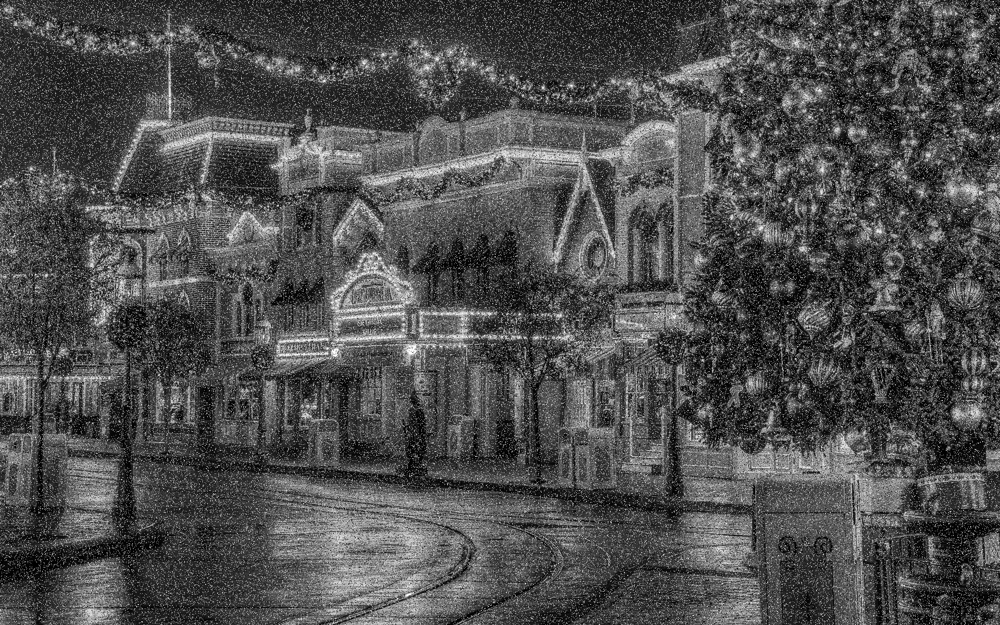

Median filter


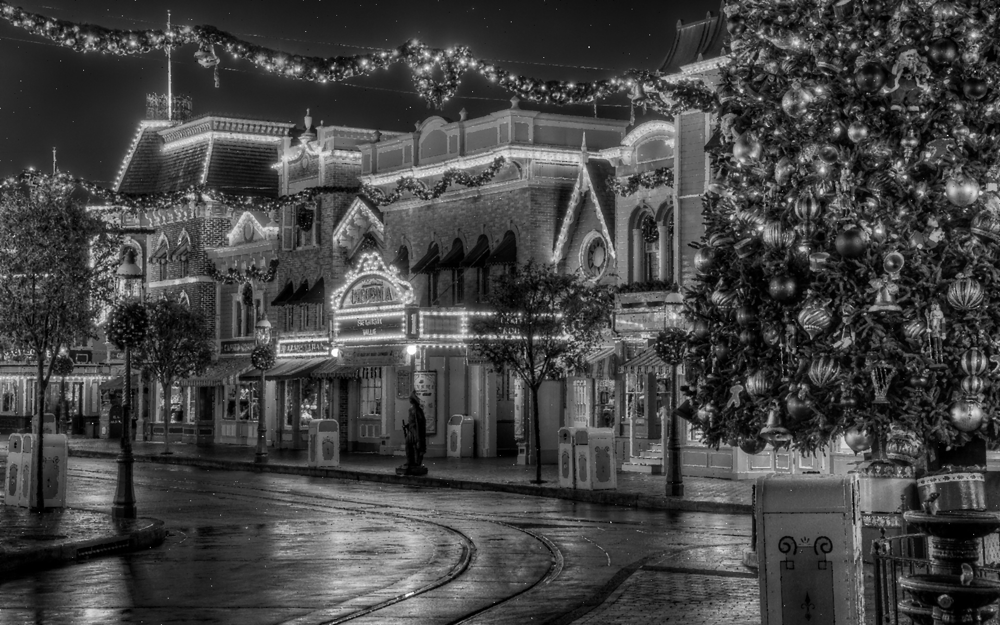

Time GPU:  0.011867761611938477
Time CPU:  142.13088631629944


In [111]:
img = cv2.imread('1.bmp', cv2.IMREAD_GRAYSCALE)
img  = noise_generator(img)
img = resize(img, 100)
block_size = 32

print("Исходное изображение")
cv2_imshow(img)
cpu_start = time.time()
cpu_img = salt_and_pepper_cpu(img)
cpu_time = time.time() - cpu_start

gpu_start = time.time()
gpu_img = median_filter(img, block_size)
gpu_time = time.time() - gpu_start
print("Median filter")
cv2.imwrite('picture_gpu.bmp', gpu_img.astype(np.uint8))
cv2_imshow(gpu_img)
print('Time GPU: ', gpu_time)
print('Time CPU: ', cpu_time)

(2560, 1730)
Исходное изображение


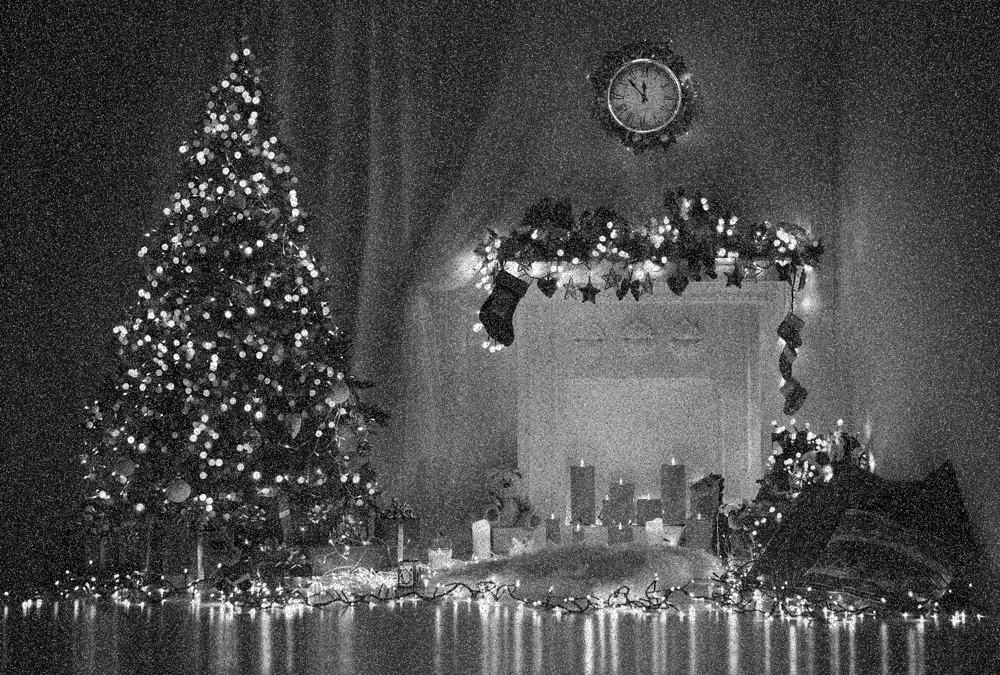

Median filter


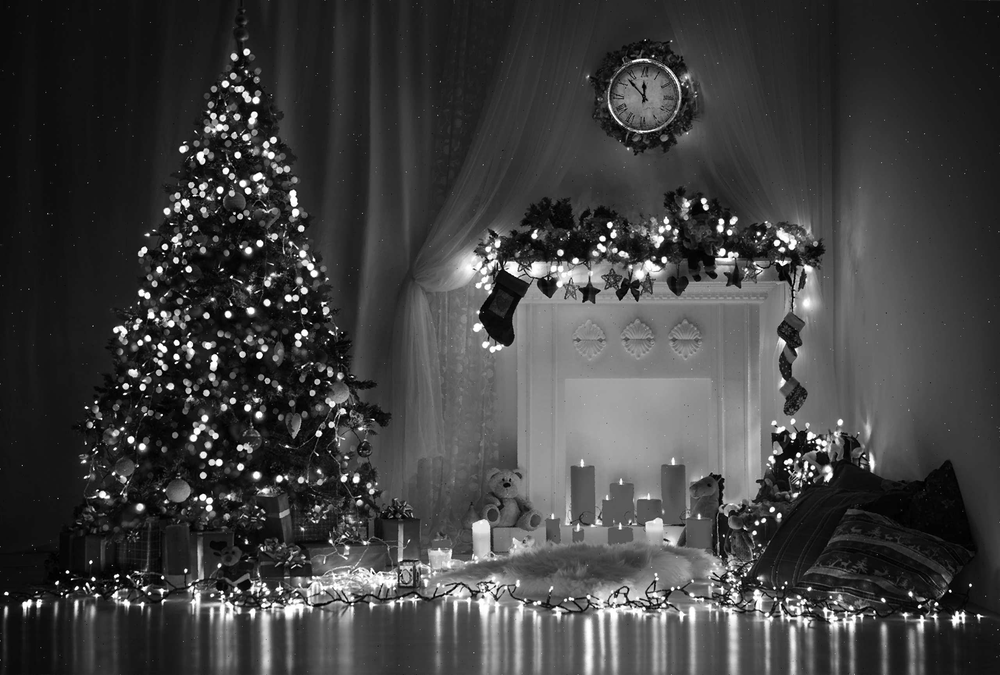

Time GPU:  0.017917633056640625
Time CPU:  263.4349570274353


In [112]:
img = cv2.imread('2.bmp', cv2.IMREAD_GRAYSCALE)
img  = noise_generator(img)
img = resize(img, 100)
block_size = 32

print("Исходное изображение")
cv2_imshow(img)
cpu_start = time.time()
cpu_img = salt_and_pepper_cpu(img)
cpu_time = time.time() - cpu_start

gpu_start = time.time()
gpu_img = median_filter(img, block_size)
gpu_time = time.time() - gpu_start
print("Median filter")
cv2.imwrite('picture_gpu.bmp', gpu_img.astype(np.uint8))
cv2_imshow(gpu_img)
print('Time GPU: ', gpu_time)
print('Time CPU: ', cpu_time)

(1920, 1200)
Исходное изображение


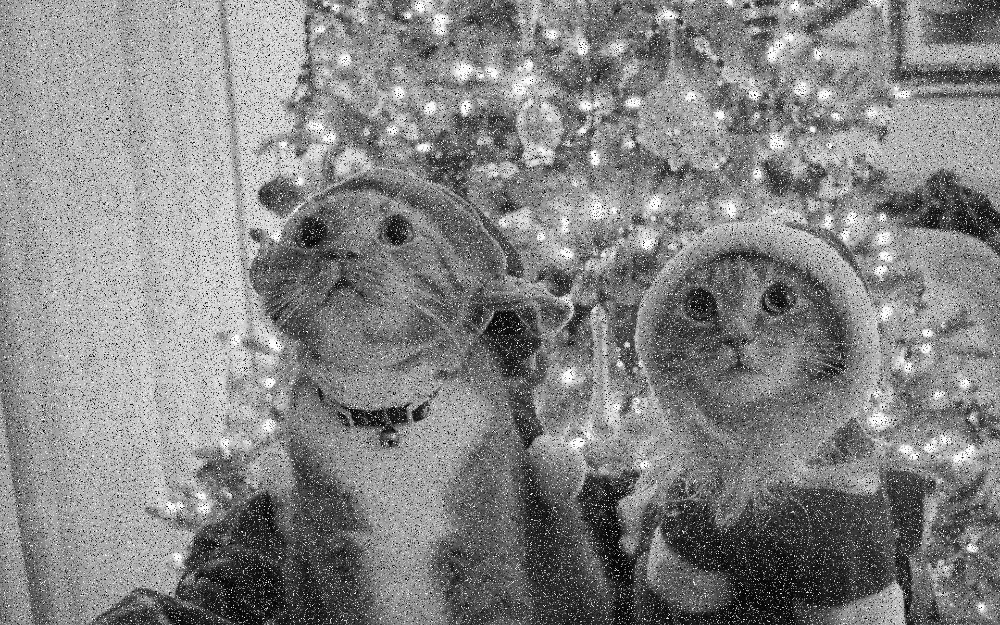

Median filter


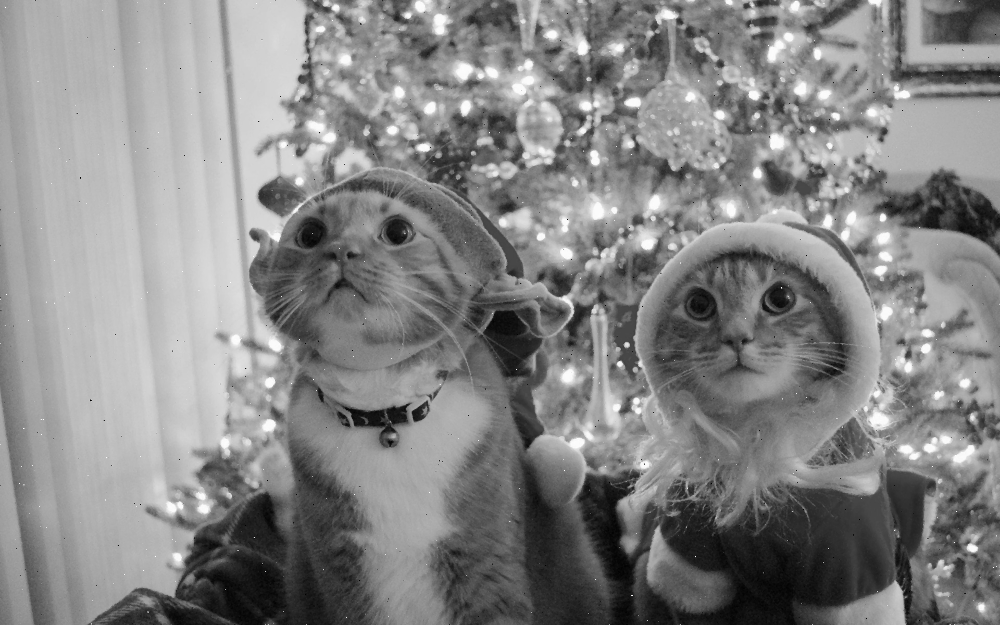

Time GPU:  0.012040376663208008
Time CPU:  138.6516125202179


In [113]:
img = cv2.imread('3.bmp', cv2.IMREAD_GRAYSCALE)
img  = noise_generator(img)
img = resize(img, 100)
block_size = 32

print("Исходное изображение")
cv2_imshow(img)
cpu_start = time.time()
cpu_img = salt_and_pepper_cpu(img)
cpu_time = time.time() - cpu_start

gpu_start = time.time()
gpu_img = median_filter(img, block_size)
gpu_time = time.time() - gpu_start
print("Median filter")
cv2.imwrite('picture_gpu.bmp', gpu_img.astype(np.uint8))
cv2_imshow(gpu_img)
print('Time GPU: ', gpu_time)
print('Time CPU: ', cpu_time)

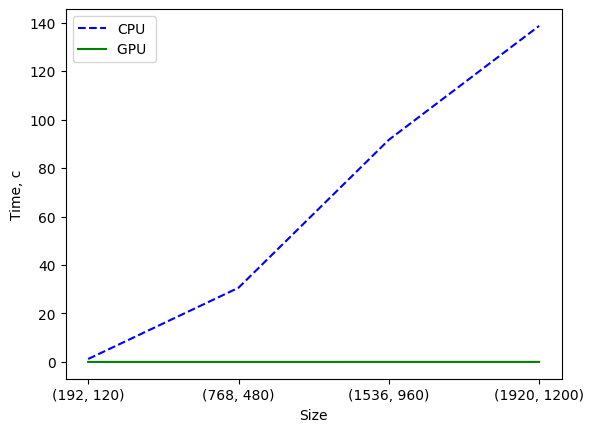

In [117]:
import matplotlib.pyplot as plt
time_cpu = [ 1.209728717803955, 30.608626127243042, 91.63890838623047, 138.6516125202179]
time_gpu = [0.0010051727294921875, 0.002872467041015625,0.007751941680908203, 0.012040376663208008]
size = ['(192, 120)', '(768, 480)', '(1536, 960)','(1920, 1200)']
plt.xlabel('Size')
plt.ylabel('Time, c')
plt.plot(size,time_cpu,'b--',size,time_gpu,'g')
plt.legend(['CPU','GPU '], loc=2)
plt.show()

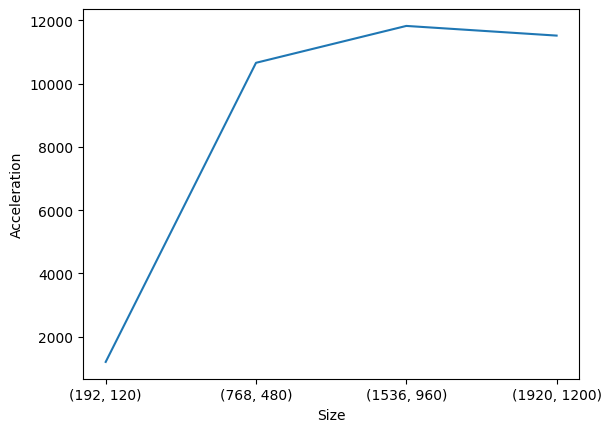

In [118]:
plt.cla()
plt.xlabel('Size')
plt.ylabel('Acceleration')
accel = []
for i in range (len(time_cpu)):
  accel.append(time_cpu[i]/time_gpu[i])

plt.plot(size,accel)
plt.show()